<a href="https://colab.research.google.com/github/manjrem/GL-AIML-Capstone/blob/milind/Stock_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip3 install yfinance==0.1.55 pandas_ta==0.2.23b0 sweetviz==2.0.6 plotly==4.14.3

In [2]:
import numpy as np
import pandas as pd
import yfinance as yf
import plotly.graph_objs as go
import pandas_ta as ta
import seaborn as sns
import sweetviz as sv
import matplotlib.pyplot as plt

In [3]:
from IPython.display import display_html
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

In [4]:
# from google.colab import drive
# drive.mount('/content/gdrive')

In [5]:
RELIANCE = yf.download(tickers='RELIANCE.NS', period='60d', interval='2m')
RELIANCE.drop('Adj Close', axis=1, inplace=True)

[*********************100%***********************]  1 of 1 completed


In [6]:
# HDFCBANK = yf.download(tickers='HDFCBANK.NS', period='60d', interval='2m')

In [7]:
# RELIANCE['AO'] = RELIANCE.ta.ao(high='High', low='Low').astype('float')
# RELIANCE['RSI'] = RELIANCE.ta.rsi(close='Close').astype('float')
# RELIANCE['ADOSC'] = RELIANCE.ta.adosc(high='High', low='Low', close='Close', volume='Volume',
#                           open_='Open').astype('float')
# RELIANCE['CMF'] = RELIANCE.ta.cmf(high='High', low='Low', close='Close', volume='Volume',
#                       open_='Open').astype('float')
# RELIANCE['OBV'] = RELIANCE.ta.obv(close='Close', volume='Volume').astype('float')
# RELIANCEM = RELIANCE.ta.macd(close='Close').astype('float')
# RELIANCE['MACD'] = RELIANCEM['MACD_12_26_9'].astype('float')
# RELIANCE['MACDH'] = RELIANCEM['MACDh_12_26_9'].astype('float')
# RELIANCE['MACDS'] = RELIANCEM['MACDs_12_26_9'].astype('float')
RELIANCE.ta.strategy(name='all', timed=True, verbose=True,)

[+] Strategy: All
[i] Indicator arguments: {'name': 'all', 'timed': True, 'append': True}
[i] Excluded[10]: above, above_value, below, below_value, cross, cross_value, long_run, short_run, trend_return, vp
[i] Multiprocessing: 4 of 4 cores.
[i] Total indicators: 113
[i] Columns added: 175
[i] Runtime: 35263.2942 ms (35.2633 s)


In [8]:
    # HDFCBANK['AO'] = HDFCBANK.ta.ao(high='High', low='Low').astype('float')
    # HDFCBANK['RSI'] = HDFCBANK.ta.rsi(close='Close').astype('float')
    # HDFCBANK['ADOSC'] = HDFCBANK.ta.adosc(high='High', low='Low', close='Close', volume='Volume',
    #                           open_='Open').astype('float')
    # HDFCBANK['CMF'] = HDFCBANK.ta.cmf(high='High', low='Low', close='Close', volume='Volume',
    #                       open_='Open').astype('float')
    # HDFCBANK['OBV'] = HDFCBANK.ta.obv(close='Close', volume='Volume').astype('float')
    # HDFCBANKM = HDFCBANK.ta.macd(close='Close').astype('float')
    # HDFCBANK['MACD'] = HDFCBANKM['MACD_12_26_9'].astype('float')
    # HDFCBANK['MACDH'] = HDFCBANKM['MACDh_12_26_9'].astype('float')
    # HDFCBANK['MACDS'] = HDFCBANKM['MACDs_12_26_9'].astype('float')
# HDFCBANK.ta.strategy(name='all', timed=True, verbose=True)

In [9]:
# HDFCBANK.fillna(value=0, inplace=True)
# HDFCBANK.reset_index(level=0, inplace=True)
RELIANCE.fillna(value=0, inplace=True)
# RELIANCE.reset_index(level=0, inplace=True)

In [10]:
RELIANCE.tail()

,open,high,low,close,volume,BIAS_SMA_26,BOP,AR_26,BR_26,CCI_14_0.015,...,VTXM_14,VWAP,VWMA_10,SUPERT_7_3.0,SUPERTd_7_3.0,SUPERTl_7_3.0,SUPERTs_7_3.0,SWMA_10,T3_10_0.7,TEMA_10
datetime,,,,,,,,,,,,,,,,,,,,,
2021-03-05 15:21:00+05:30,2178.100098,2181.399902,2177.250000,2178.949951,114638,0.000219,0.204789,89.043361,87.958644,5.552518,...,1.011678,2009.312823,2179.770333,2184.268850,-1,0.0,2184.268850,2179.993359,2180.209781,2179.054954
2021-03-05 15:23:00+05:30,2179.050049,2179.149902,2176.250000,2176.899902,75086,-0.000696,-0.741455,78.378906,77.052143,-106.940952,...,1.022437,2009.345996,2179.455647,2184.268850,-1,0.0,2184.268850,2179.756689,2180.129308,2177.985469
2021-03-05 15:25:00+05:30,2176.899902,2177.000000,2174.399902,2174.800049,59804,-0.001594,-0.807606,70.007033,69.571368,-188.677063,...,1.058441,2009.372088,2178.966538,2184.268850,-1,0.0,2184.268850,2179.328353,2179.899673,2176.336258
2021-03-05 15:27:00+05:30,2174.850098,2175.699951,2172.699951,2174.500000,76849,-0.001724,-0.116699,74.351570,75.527676,-192.144972,...,1.097287,2009.405382,2178.467326,2183.455066,-1,0.0,2183.455066,2178.723348,2179.521282,2175.135054
2021-03-05 15:29:00+05:30,2178.699951,2178.699951,2178.699951,2178.699951,0,0.000169,1.000000,69.691945,77.808329,-1.955158,...,1.044944,2009.405382,2178.206919,2183.455066,-1,0.0,2183.455066,2178.138338,2179.122900,2176.289260


In [11]:
import plotly.graph_objects as go
import datetime

In [12]:
candlestickR = go.Candlestick(
                            x=RELIANCE.index,
                            open=RELIANCE['open'],
                            high=RELIANCE['high'],
                            low=RELIANCE['low'],
                            close=RELIANCE['close']
                            )

fig = go.Figure(data=[candlestickR])
fig.update_layout(xaxis_rangeslider_visible=True, autosize=True, title="Reliance Data for past 60 days with Interval = 2 minutes")
fig.update_yaxes(automargin=True, showgrid=True, showspikes=True)
fig.show()

In [13]:
from sklearn.preprocessing import StandardScaler
from sklearn.svm import OneClassSVM
from sklearn.cluster import KMeans
from sklearn.ensemble import IsolationForest
import plotly.express as px

In [14]:
RELIANCE.reset_index(inplace=True)

In [15]:
def getDistanceByPoint(data, model):
    distance = pd.Series()
    for i in range(0,len(data)):
        Xa = data[i]
        Xb = model.cluster_centers_[model.labels_[i]-1]
        distance.loc[i] = np.linalg.norm(Xa-Xb)
    return distance

<AxesSubplot:>

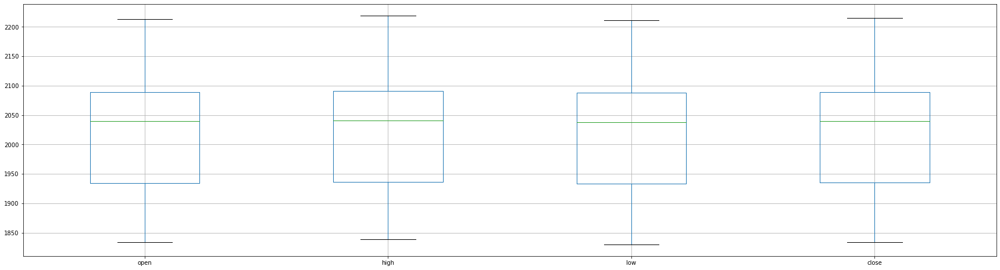

In [16]:
RELIANCE[['open', 'high', 'low', 'close']].boxplot(figsize=(30,8), )

In [17]:
scaler = StandardScaler()
outliers_fraction = 0.3
random_state = 0

In [18]:
df_CC_Rel_std = pd.DataFrame(StandardScaler().fit_transform(RELIANCE.drop('datetime', axis=1)))
np_scaled_rel = scaler.fit_transform(df_CC_Rel_std)
kmeans_rel = KMeans(n_clusters=10, random_state=random_state).fit(np_scaled_rel)

In [19]:
distance_rel = getDistanceByPoint(np_scaled_rel, kmeans_rel)
number_of_outliers_rel = int(outliers_fraction*len(distance_rel))
threshold_rel = distance_rel.nlargest(number_of_outliers_rel).min()
RELIANCE['anomaly1'] = (distance_rel >= threshold_rel).astype(int)

<ipython-input-15-42bf17df848b>:2: DeprecationWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



In [20]:
RELIANCE.anomaly1.value_counts()

0    3869
1    1658
Name: anomaly1, dtype: int64

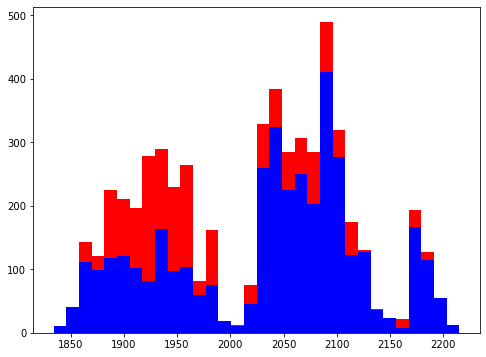

In [21]:
a = RELIANCE.loc[RELIANCE['anomaly1'] == 0, 'close']
b = RELIANCE.loc[RELIANCE['anomaly1'] == 1, 'close']

fig, axs = plt.subplots(figsize=(8,6))
axs.hist([a,b], bins=32, stacked=True, color=['blue', 'red'])
plt.show()

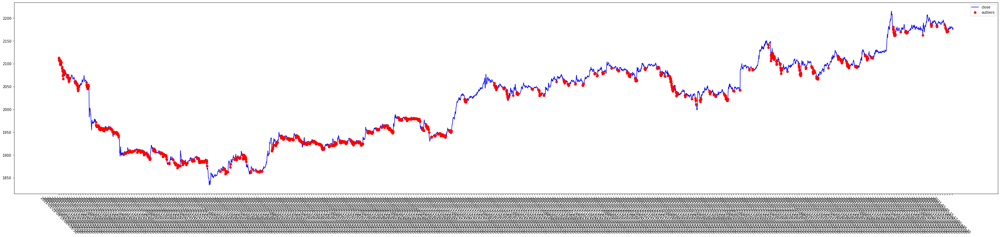

In [22]:
plt.figure(figsize=(50, 10))
plt.plot(RELIANCE['close'], label='close',c='b')
plt.plot(RELIANCE['close'], 'o', label='outliers',markevery=RELIANCE.loc[RELIANCE['anomaly1'] == 1].index.tolist(),c='r')
plt.xticks(np.arange(RELIANCE.shape[0])[::15],RELIANCE['datetime'][::15],rotation='-45')
plt.legend()
plt.show()

In [23]:
model_if_Rel = IsolationForest(contamination=outliers_fraction, random_state=random_state)
model_if_Rel.fit(np_scaled_rel)
outliers_if_rel = model_if_Rel.predict(np_scaled_rel)

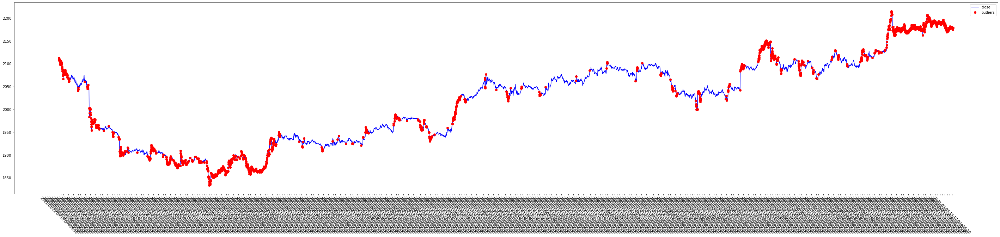

In [24]:
plt.figure(figsize=(50, 10))
plt.plot(RELIANCE['close'], label='close',c='b')
plt.plot(RELIANCE['close'], 'o', label='outliers',
         markevery=(np.where(outliers_if_rel==-1)[0]).tolist(),c='r')
plt.xticks(np.arange(RELIANCE.shape[0])[::15],RELIANCE['datetime'][::15],rotation='-45')
plt.legend()
plt.show()

In [25]:
model_ocs_Rel = OneClassSVM(nu=outliers_fraction, kernel="rbf", gamma=0.01)
model_ocs_Rel.fit(np_scaled_rel)
outliers_ocs_rel = model_ocs_Rel.predict(np_scaled_rel)

In [26]:
plt.figure(figsize=(50, 10), dpi=800)
plt.plot(RELIANCE['close'], label='close',c='b')
plt.plot(RELIANCE['close'], 'o', label='outliers',
         markevery=(np.where(outliers_ocs_rel==-1)[0]).tolist(),c='r')
plt.xticks(np.arange(RELIANCE.shape[0])[::15],RELIANCE['datetime'][::15],rotation='-45')
plt.legend()
plt.show()

In [27]:
from sklearn.covariance import EllipticEnvelope

In [28]:
envelope_ee_Rel = EllipticEnvelope(contamination = outliers_fraction, random_state=random_state, support_fraction=0.9999)
envelope_ee_Rel.fit(np_scaled_rel)
outliers_ee_Rel = envelope_ee_Rel.predict(np_scaled_rel)

C:\Users\mmanjrek\Anaconda3\lib\site-packages\sklearn\covariance\_robust_covariance.py:647: UserWarning:

The covariance matrix associated to your dataset is not full rank



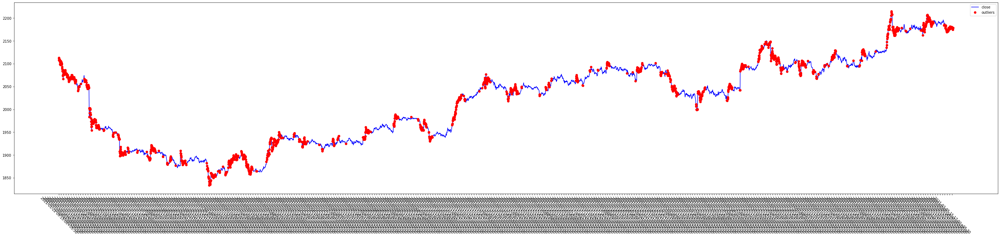

In [29]:
plt.figure(figsize=(50, 10))
plt.plot(RELIANCE['close'], label='close',c='b')
plt.plot(RELIANCE['close'], 'o', label='outliers',
         markevery=(np.where(outliers_ee_Rel==-1)[0]).tolist(),c='r')
plt.xticks(np.arange(RELIANCE.shape[0])[::15],RELIANCE['datetime'][::15],rotation='-45')
plt.legend()
plt.show()

In [30]:
REL_top_positive = pd.DataFrame()
REL_top_negative = pd.DataFrame()
REL_top_positive_vol = pd.DataFrame()
REL_top_negative_vol = pd.DataFrame()
REL_top_positive['open'] = RELIANCE.corrwith(RELIANCE.open, method='kendall').sort_values(ascending=False).head(25)
REL_top_positive['high'] = RELIANCE.corrwith(RELIANCE.high, method='kendall').sort_values(ascending=False).head(25)
REL_top_positive['low'] = RELIANCE.corrwith(RELIANCE.low, method='kendall').sort_values(ascending=False).head(25)
REL_top_positive['close'] = RELIANCE.corrwith(RELIANCE.close, method='kendall').sort_values(ascending=False).head(25)
REL_top_positive_vol['vol_val'] = RELIANCE.corrwith(RELIANCE.volume, method='kendall').sort_values(ascending=False).head(25)
REL_top_negative['open'] = RELIANCE.corrwith(RELIANCE.open, method='kendall').sort_values(ascending=True).head(25)
REL_top_negative['high'] = RELIANCE.corrwith(RELIANCE.high, method='kendall').sort_values(ascending=True).head(25)
REL_top_negative['low'] = RELIANCE.corrwith(RELIANCE.low, method='kendall').sort_values(ascending=True).head(25)
REL_top_negative['close'] = RELIANCE.corrwith(RELIANCE.close, method='kendall').sort_values(ascending=True).head(25)
REL_top_negative_vol['vol_val'] = RELIANCE.corrwith(RELIANCE.volume, method='kendall').sort_values(ascending=True).head(25)

Features with high correlation are more linearly dependent and hence have almost the same effect on the dependent variable. 

So, when two features have high correlation, we can drop one of the two features.

Kendall’s tau = The intuition for the test is that it calculates a normalized score for the number of matching or concordant rankings between the two samples.

In [31]:
display_side_by_side(REL_top_negative.reset_index(), REL_top_positive.reset_index(), REL_top_positive_vol.reset_index(), REL_top_negative_vol.reset_index())

,index,open,high,low,close
0,anomaly1,-0.208966,-0.210464,-0.211986,-0.212671
1,DMN_14,-0.114013,-0.116006,-0.118811,-0.118702
2,volume,-0.108441,-0.102680,-0.115417,-0.108672
3,PVOL,-0.072462,-0.066688,-0.079429,-0.072680
4,VTXM_14,-0.057696,-0.060585,-0.059233,-0.060898
5,SQZ_OFF,-0.056661,-0.054728,-0.058740,-0.056540
6,AMAT_SR_2,-0.045562,-0.049174,-0.049119,-0.051940
7,UI_14,-0.045335,-0.043344,-0.048134,-0.045613
8,AOBV_SR_2,-0.026568,-0.030217,-0.030421,-0.032972
9,PVO_12_26_9,-0.022231,-0.018571,-0.026398,-0.022217


In [32]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [33]:
RIL_X = RELIANCE.drop(['close', 'datetime', 'anomaly1'], axis=1)
RIL_y = RELIANCE['close']

In [34]:
model_LinR = LinearRegression(normalize=True)
rfe = RFE(model_LinR, 25)

C:\Users\mmanjrek\Anaconda3\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning:

Pass n_features_to_select=25 as keyword args. From version 0.25 passing these as positional arguments will result in an error



In [35]:
fit = rfe.fit(RIL_X, RIL_y)

In [36]:
d = pd.DataFrame()
d['columns'] = RELIANCE.drop(['close', 'datetime', 'anomaly1'], axis=1).columns.to_list()
d['selected'] = fit.support_.tolist()
d['rank'] = fit.ranking_.tolist()
d[d['selected'] == True].T

,0,1,2,59,60,73,77,78,79,80,...,108,109,110,120,121,122,129,130,131,163
columns,open,high,low,HL2,HLC3,HA_close,LOGRET_1,MACD_12_26_9,MACDh_12_26_9,MACDs_12_26_9,...,PPO_12_26_9,PPOh_12_26_9,PPOs_12_26_9,SMI_5_20_5,SMIs_5_20_5,SMIo_5_20_5,SQZ_ON,SQZ_OFF,SQZ_NO,WCP
selected,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
rank,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


In [37]:
from sklearn import preprocessing
from sklearn import utils

In [38]:
lab_enc = preprocessing.LabelEncoder()
RIL_y_encoded = lab_enc.fit_transform(RIL_y)

In [39]:
from sklearn.decomposition import PCA

In [40]:
pca = PCA(n_components=25)
fit = pca.fit(RIL_X)

In [41]:
print("Explained Variance: %s" % fit.explained_variance_ratio_)
print(fit.components_)

Explained Variance: [9.96017966e-01 3.90565737e-03 6.43073784e-05 8.87393696e-06
 2.56315587e-06 4.74611086e-07 8.41305853e-08 5.49429987e-08
 1.60732165e-08 1.06313219e-09 5.92041796e-10 2.70644567e-10
 5.78286394e-11 5.12757535e-11 1.59239445e-11 1.32804460e-11
 9.07874767e-12 8.24421490e-12 1.99863564e-12 1.24676264e-12
 7.11050564e-13 4.38729222e-13 3.61464473e-13 2.40068342e-13
 2.20719329e-13]
[[-2.36635458e-08 -2.04657855e-08 -2.81789326e-08 ... -4.39647365e-08
  -4.17321650e-08 -3.97961333e-08]
 [ 7.71650607e-06  7.73093238e-06  7.70128823e-06 ...  7.32607366e-06
   7.31761055e-06  7.54570727e-06]
 [ 1.35226284e-05  1.35696660e-05  1.36163606e-05 ...  2.16888200e-05
   2.18391946e-05  1.73284679e-05]
 ...
 [-6.72595998e-02 -6.68033798e-02 -6.77585825e-02 ...  9.13918470e-02
   3.13943968e-02  1.81647358e-01]
 [-6.42867256e-03 -5.63306343e-03 -6.00873068e-03 ...  8.83917113e-03
  -2.62945763e-01  3.78205598e-01]
 [ 1.14437880e-02  9.91284284e-03  1.04706659e-02 ...  4.74358304e-

In [67]:
fit.explained_variance_.tolist()

[3.107361690487742e+16,
 121848104014821.2,
 2006251802141.5317,
 276847734463.1855,
 79964946793.72443,
 14806844410.932383,
 2624693195.227581,
 1714103308.9019022,
 501449761.78686756,
 33167436.37754182,
 18470429.84789803,
 8443527.995500965,
 1804129.0886724596,
 1599693.1515449686,
 496792.7955248692,
 414321.3341218714,
 283237.3880291596,
 257201.76157667147,
 62353.13057094211,
 38896.310947590726,
 22183.24725449724,
 13687.407497383894,
 11276.913622520637,
 7489.615589647501,
 6885.9680169205]

In [60]:
fit.explained_variance_ratio_.tolist()

[0.9960179663169018,
 0.0039056573662450923,
 6.430737837843954e-05,
 8.873936957631144e-06,
 2.563155873548247e-06,
 4.746110857610778e-07,
 8.413058532964168e-08,
 5.4942998654320296e-08,
 1.6073216499835744e-08,
 1.0631321944217923e-09,
 5.920417964351861e-10,
 2.7064456668700997e-10,
 5.7828639368681086e-11,
 5.127575346025462e-11,
 1.5923944463700356e-11,
 1.3280446041316727e-11,
 9.078747674379478e-12,
 8.244214900471096e-12,
 1.9986356430562097e-12,
 1.2467626361567253e-12,
 7.110505637102465e-13,
 4.387292223312167e-13,
 3.6146447344761324e-13,
 2.400683419291673e-13,
 2.2071932859736856e-13]

In [42]:
pd.DataFrame(fit.components_)

,0,1,2,3,4,5,6,7,8,9,...,169,170,171,172,173,174,175,176,177,178
0,-2.366355e-08,-2.046579e-08,-2.817893e-08,0.000497,-7.126218e-13,3.169072e-11,9.712039e-09,1.117879e-08,2.871913e-09,-3.741378e-08,...,-6.140212e-11,1.450759e-08,-4.383798e-08,-2.608964e-08,-4.629623e-11,-4.995927e-08,2.386963e-08,-4.396474e-08,-4.173217e-08,-3.979613e-08
1,7.716506e-06,7.730932e-06,7.701288e-06,-0.000283,3.397538e-12,-5.939268e-10,3.289130e-08,7.403842e-08,1.412125e-07,7.539114e-06,...,-6.223689e-10,2.379788e-06,7.325822e-06,7.668250e-06,-1.314491e-09,2.760297e-06,4.907953e-06,7.326074e-06,7.317611e-06,7.545707e-06
2,1.352263e-05,1.356967e-05,1.361636e-05,-0.000758,5.924791e-10,1.579932e-08,5.769365e-06,6.758321e-06,7.711454e-06,1.720027e-05,...,-1.094019e-08,-1.605606e-05,2.169567e-05,1.325881e-05,1.145464e-07,1.223584e-04,-1.090996e-04,2.168882e-05,2.183919e-05,1.732847e-05
3,-2.750820e-05,-2.765245e-05,-2.749024e-05,0.001332,-8.521572e-10,-7.644603e-09,-4.996508e-06,-8.259582e-06,-1.012617e-05,-2.099879e-05,...,2.664855e-08,-6.473868e-07,-1.329428e-05,-2.422252e-05,-1.751524e-07,-1.739100e-04,1.496875e-04,-1.327819e-05,-1.327375e-05,-2.155065e-05
4,2.345312e-06,1.364558e-06,6.869243e-07,0.002142,-1.052178e-08,-2.688467e-07,-4.167325e-05,-5.328589e-05,-1.729879e-04,9.992933e-06,...,2.698183e-07,8.156858e-07,1.539487e-05,1.909688e-05,-1.026758e-06,-1.024048e-03,1.043145e-03,1.591576e-05,1.880771e-05,6.174970e-06
5,-9.563079e-06,-9.916723e-06,-9.804776e-06,0.005201,-7.752624e-09,-5.220492e-07,-6.061955e-05,-6.179424e-05,-2.523437e-04,-6.011450e-06,...,4.013124e-07,1.086395e-05,-3.428633e-05,4.907638e-06,-1.303154e-06,-1.300891e-03,1.305799e-03,-3.398103e-05,-5.104123e-05,2.416836e-06
6,6.206111e-06,-1.326447e-06,-3.925051e-06,-0.004917,1.268385e-09,-2.141041e-06,-1.181420e-04,-1.129826e-04,-1.600256e-04,1.537258e-05,...,-1.187105e-07,2.326448e-05,-6.904179e-05,8.020970e-06,6.782754e-07,6.663870e-04,-6.583660e-04,-6.769323e-05,-1.277174e-04,6.905533e-05
7,-2.574099e-05,-1.168399e-05,-6.739562e-06,-0.009724,-5.192759e-09,6.375675e-06,-1.573638e-04,-1.758493e-04,2.324316e-04,-1.180184e-05,...,4.511483e-07,4.456310e-05,-2.553886e-05,-1.684215e-05,-2.022745e-06,-2.068750e-03,2.051908e-03,-2.897840e-05,-1.204353e-04,1.466397e-04
8,6.031044e-06,4.684243e-07,-4.132774e-06,0.012112,-2.833354e-08,-3.230991e-06,-3.015819e-04,-3.307746e-04,4.773694e-04,-3.266008e-05,...,9.534034e-07,5.623043e-05,-4.055367e-05,5.022075e-05,-6.021670e-06,-5.959648e-03,6.009869e-03,-5.581235e-05,-1.670399e-04,2.185949e-04
9,5.244262e-04,5.071631e-04,5.299591e-04,-0.487701,2.516649e-08,-2.854362e-06,4.130975e-04,2.990895e-04,-6.555795e-04,-1.189615e-03,...,-1.081004e-06,4.555765e-05,-1.470735e-03,-9.022028e-04,-1.654081e-06,-2.583756e-03,1.681554e-03,-1.469606e-03,-1.436326e-03,-1.263654e-03


In [43]:
from sklearn.ensemble import ExtraTreesClassifier

In [44]:
model_ExTreeClss = ExtraTreesClassifier(n_estimators=25, random_state=random_state, criterion='entropy')
model_ExTreeClss.fit(RIL_X, RIL_y_encoded)

ExtraTreesClassifier(criterion='entropy', n_estimators=25, random_state=0)

In [45]:
d = pd.DataFrame()
d['columns'] = RELIANCE.drop(['close', 'datetime', 'anomaly1'], axis=1).columns.to_list()
d['rank'] = model_ExTreeClss.feature_importances_.tolist()
d.sort_values(by='rank', ascending=False).head(25).T

,163,73,1,59,72,2,86,51,94,60,...,71,165,24,36,15,53,69,119,11,85
columns,WCP,HA_close,high,HL2,HA_low,low,MIDPRICE_2,LDECAY_5,OHLC4,HLC3,...,HA_high,WMA_10,OBV,BBL_5_2.0,ACCBU_20,DEMA_10,FWMA_10,SMA_10,ABER_XG_5_15,MIDPOINT_2
rank,0.0228785,0.0210017,0.0179556,0.0170651,0.0160258,0.0155027,0.0151363,0.0138974,0.0133182,0.0132251,...,0.00995402,0.00987175,0.00961608,0.00956806,0.00955043,0.00934664,0.00933754,0.00901682,0.00894298,0.00892201


In [46]:
d.sort_values(by='rank', ascending=True).head(25).T

,131,114,156,91,90,129,130,167,45,77,...,161,118,110,154,108,96,48,63,159,50
columns,SQZ_NO,PSARr_0.02_0.2,THERMOl_20_2_0.5,CDL_INSIDE,CDL_DOJI_10_0.1,SQZ_ON,SQZ_OFF,VAR_30,ENTP_10,LOGRET_1,...,TRUERANGE_1,SLOPE_1,PPOs_12_26_9,THERMO_20_2_0.5,PPO_12_26_9,PCTRET_1,BULLP_13,ISB_26,TRIX_30_9,COPC_11_14_10
rank,0,0.000188431,0.000255903,0.000384894,0.000739378,0.00139718,0.00175919,0.00242093,0.00242637,0.00253336,...,0.00264707,0.00267886,0.00269993,0.00270457,0.00271832,0.00276563,0.00282119,0.00283788,0.00284837,0.00285354


In [47]:
model_ExTreeClss = ExtraTreesClassifier(n_estimators=25, random_state=random_state)
model_ExTreeClss.fit(RIL_X, RIL_y_encoded)

ExtraTreesClassifier(n_estimators=25, random_state=0)

In [48]:
d = pd.DataFrame()
d['columns'] = RELIANCE.drop(['close', 'datetime', 'anomaly1'], axis=1).columns.to_list()
d['rank'] = model_ExTreeClss.feature_importances_.tolist()
d.sort_values(by='rank', ascending=False).head(25).T

,163,51,60,94,73,59,85,1,72,71,...,166,154,69,178,118,47,92,143,101,61
columns,WCP,LDECAY_5,HLC3,OHLC4,HA_close,HL2,MIDPOINT_2,high,HA_low,HA_high,...,ZL_EMA_10,THERMO_20_2_0.5,FWMA_10,TEMA_10,SLOPE_1,ER_10,CFO_9,LR_14,PVOL,HMA_10
rank,0.0110008,0.0102354,0.00970776,0.00898627,0.0085836,0.00837233,0.0081973,0.00808586,0.0080267,0.00794512,...,0.00707378,0.00704822,0.00698919,0.00688649,0.0068736,0.00677582,0.0067728,0.00670291,0.00666576,0.0066633


In [49]:
d.sort_values(by='rank', ascending=True).head(25).T

,131,156,114,173,129,130,21,22,175,174,...,39,172,145,112,111,41,65,75,76,83
columns,SQZ_NO,THERMOl_20_2_0.5,PSARr_0.02_0.2,SUPERTd_7_3.0,SQZ_ON,SQZ_OFF,AMAT_LR_2,AMAT_SR_2,SUPERTs_7_3.0,SUPERTl_7_3.0,...,DCL_20_20,SUPERT_7_3.0,TTM_TRND_6,PSARs_0.02_0.2,PSARl_0.02_0.2,DCU_20_20,IKS_26,HILOl_13_21,HILOs_13_21,MEDIAN_30
rank,7.24058e-06,0.00135,0.0014221,0.00151068,0.00175228,0.0020441,0.00240346,0.00263201,0.00280394,0.00292035,...,0.00385122,0.00393321,0.00394007,0.00397587,0.00403773,0.00406522,0.00415296,0.0042084,0.00444744,0.00450158


In [50]:
# !pip install GetOldTweets3==0.0.11 tweepy==3.6.0

In [51]:
# import tweepy

In [52]:
# consumer_key= 'R7q8nGoVuoHwm5z4D1dT21DYI'
# consumer_secret= 'IaSxfv982scjsHLmEGkg3b89KOXjOlajCSlGYGShu1FsyZkHSx'
# access_token= '1360932316776816643-cEd2WEgR2W4F1lnKfZFc8Af9hJ1dk2'
# access_token_secret= 'yiDj4JQHqOVjzGubnQBqSCOBDVJdLhmD2yhsvTySJ2ji3'

In [53]:
# auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
# auth.set_access_token(access_token, access_token_secret)
# api = tweepy.API(auth, wait_on_rate_limit=True, wait_on_rate_limit_notify=True, retry_count=3, retry_delay=3)

In [54]:
# msg = pd.DataFrame()

In [55]:
# for tweet in tweepy.Cursor(api.search, q='#reliance', rpp=100).items():
#   tw = [(tweet.text, tweet.created_at, tweet.retweet_count, tweet.favorite_count, tweet.lang)]
#   msg = msg.append(tw)
#   pass

In [56]:
# tweets = msg.rename(columns={'0':'tweets', '1':'created_at', '2':'retweet_count', '3':'favorite_count', '4':'lang'}, copy=True)
# tweets

In [57]:
# Reliance_Report.show_html('/content/gdrive/My Drive/data/reliance_eda.html')
# HDFCBank_Report.show_html('/content/gdrive/My Drive/data/hdfc_eda.html')

In [58]:
# RELIANCE.to_csv('/content/gdrive/My Drive/data/RIL.csv', mode='a', columns=['open', 'high', 'low', 'close', 'adj_close', 'volume', 'AD', 'ADOSC_3_10', 'ABER_ZG_5_15', 'ABER_SG_5_15', 'ABER_XG_5_15', 'ABER_ATR_5_15', 'ACCBL_20', 
#                                                                     'ACCBM_20', 'ACCBU_20', 'ADX_14', 'DMP_14', 'DMN_14', 'AMAT_LR_2', 'AMAT_SR_2', 'AO_5_34', 'OBV', 'OBV_min_2', 'OBV_max_2', 'OBV_EMA_4', 'OBV_EMA_12', 
#                                                                     'AOBV_LR_2', 'AOBV_SR_2', 'APO_12_26', 'AROOND_14', 'AROONU_14', 'AROONOSC_14', 'BIAS_SMA_26', 'BOP', 'AR_26', 'BR_26', 'CCI_14_0.015', 'CDL_DOJI_10_0.1', 
#                                                                     'CDL_INSIDE', 'ATR_14', 'BBL_5_2.0', 'BBM_5_2.0', 'BBU_5_2.0', 'CHOP_14_1_100', 'CKSPl_10_1_9', 'CKSPs_10_1_9', 'CMF_20', 'CMO_14', 'COPC_11_14_10', 
#                                                                     'LDECAY_5', 'DEC_1', 'DEMA_10', 'DCL_20_20', 'DCM_20_20', 'DCU_20_20', 'DPO_20', 'EFI_13', 'EMA_10', 'ENTP_10', 'EOM_14_100000000', 'ER_10', 'BULLP_13', 
#                                                                     'BEARP_13', 'FISHERT_9_1', 'FISHERTs_9_1', 'FWMA_10', 'HA_open', 'HA_high', 'HA_low', 'HA_close', 'HILO_13_21', 'HILOl_13_21', 'HILOs_13_21', 'HL2', 'HLC3', 
#                                                                     'CFO_9', 'CG_10', 'HMA_10', 'ISA_9', 'ISB_26', 'ITS_9', 'IKS_26', 'ICS_26', 'KAMA_10_2_30', 'KCL_20_2', 'KCB_20_2', 'KCU_20_2', 'K_9_3', 'D_9_3', 'J_9_3', 
#                                                                     'KST_10_15_20_30_10_10_10_15', 'KSTs_9', 'INC_1', 'INERTIA_20_14', 'LOGRET_1', 'MACD_12_26_9', 'MACDh_12_26_9', 'MACDs_12_26_9', 'MAD_30', 'MASSI_9_25', 
#                                                                     'MEDIAN_30', 'MFI_14', 'MIDPOINT_2', 'MIDPRICE_2', 'MOM_10', 'NATR_14', 'NVI_1', 'OHLC4', 'PDIST', 'KURT_30', 'LR_14', 'PCTRET_1', 'PGO_14', 'PSL_12', 
#                                                                     'PVI_1', 'PVO_12_26_9', 'PVOh_12_26_9', 'PVOs_12_26_9', 'PVOL', 'PVT', 'PWMA_10', 'QS_10', 'QTL_30_0.5', 'RMA_10', 'ROC_10', 'RSI_14', 'RVGI_14_4', 
#                                                                     'RVGIs_14_4', 'PPO_12_26_9', 'PPOh_12_26_9', 'PPOs_12_26_9', 'PSARl_0.02_0.2', 'PSARs_0.02_0.2', 'PSARaf_0.02_0.2', 'PSARr_0.02_0.2', 'SKEW_30', 'SLOPE_1', 
#                                                                     'SMA_10', 'SMI_5_20_5', 'SMIs_5_20_5', 'SMIo_5_20_5', 'RVI_14', 'SINWMA_14', 'STOCHk_14_3_3', 'STOCHd_14_3_3', 'STOCHRSIk_14_14_3_3', 'STOCHRSId_14_14_3_3', 
#                                                                     'SQZ_20_2.0_20_1.5', 'SQZ_ON', 'SQZ_OFF', 'SQZ_NO', 'STDEV_30', 'T3_10_0.7', 'TEMA_10', 'THERMO_20_2_0.5', 'THERMOma_20_2_0.5', 'THERMOl_20_2_0.5', 
#                                                                     'THERMOs_20_2_0.5', 'TRIMA_10', 'TRIX_30_9', 'TRIXs_30_9', 'TRUERANGE_1', 'TSI_13_25', 'TTM_TRND_6', 'UI_14', 'UO_7_14_28', 'VAR_30', 'VTXP_14', 'VTXM_14', 
#                                                                     'VWAP', 'VWMA_10', 'WCP', 'WILLR_14', 'WMA_10', 'ZL_EMA_10', 'Z_30', 'SUPERT_7_3.0', 'SUPERTd_7_3.0', 'SUPERTl_7_3.0', 'SUPERTs_7_3.0', 'SWMA_10'])
# HDFCBANK.to_csv('/content/gdrive/My Drive/data/HDFCBank.csv', mode='a', columns=['open', 'high', 'low', 'close', 'adj_close', 'volume', 'AD', 'ADOSC_3_10', 'ABER_ZG_5_15', 'ABER_SG_5_15', 'ABER_XG_5_15', 'ABER_ATR_5_15', 'ACCBL_20', 
#                                                                     'ACCBM_20', 'ACCBU_20', 'ADX_14', 'DMP_14', 'DMN_14', 'AMAT_LR_2', 'AMAT_SR_2', 'AO_5_34', 'OBV', 'OBV_min_2', 'OBV_max_2', 'OBV_EMA_4', 'OBV_EMA_12', 
#                                                                     'AOBV_LR_2', 'AOBV_SR_2', 'APO_12_26', 'AROOND_14', 'AROONU_14', 'AROONOSC_14', 'BIAS_SMA_26', 'BOP', 'AR_26', 'BR_26', 'CCI_14_0.015', 'CDL_DOJI_10_0.1', 
#                                                                     'CDL_INSIDE', 'ATR_14', 'BBL_5_2.0', 'BBM_5_2.0', 'BBU_5_2.0', 'CHOP_14_1_100', 'CKSPl_10_1_9', 'CKSPs_10_1_9', 'CMF_20', 'CMO_14', 'COPC_11_14_10', 
#                                                                     'LDECAY_5', 'DEC_1', 'DEMA_10', 'DCL_20_20', 'DCM_20_20', 'DCU_20_20', 'DPO_20', 'EFI_13', 'EMA_10', 'ENTP_10', 'EOM_14_100000000', 'ER_10', 'BULLP_13', 
#                                                                     'BEARP_13', 'FISHERT_9_1', 'FISHERTs_9_1', 'FWMA_10', 'HA_open', 'HA_high', 'HA_low', 'HA_close', 'HILO_13_21', 'HILOl_13_21', 'HILOs_13_21', 'HL2', 'HLC3', 
#                                                                     'CFO_9', 'CG_10', 'HMA_10', 'ISA_9', 'ISB_26', 'ITS_9', 'IKS_26', 'ICS_26', 'KAMA_10_2_30', 'KCL_20_2', 'KCB_20_2', 'KCU_20_2', 'K_9_3', 'D_9_3', 'J_9_3', 
#                                                                     'KST_10_15_20_30_10_10_10_15', 'KSTs_9', 'INC_1', 'INERTIA_20_14', 'LOGRET_1', 'MACD_12_26_9', 'MACDh_12_26_9', 'MACDs_12_26_9', 'MAD_30', 'MASSI_9_25', 
#                                                                     'MEDIAN_30', 'MFI_14', 'MIDPOINT_2', 'MIDPRICE_2', 'MOM_10', 'NATR_14', 'NVI_1', 'OHLC4', 'PDIST', 'KURT_30', 'LR_14', 'PCTRET_1', 'PGO_14', 'PSL_12', 
#                                                                     'PVI_1', 'PVO_12_26_9', 'PVOh_12_26_9', 'PVOs_12_26_9', 'PVOL', 'PVT', 'PWMA_10', 'QS_10', 'QTL_30_0.5', 'RMA_10', 'ROC_10', 'RSI_14', 'RVGI_14_4', 
#                                                                     'RVGIs_14_4', 'PPO_12_26_9', 'PPOh_12_26_9', 'PPOs_12_26_9', 'PSARl_0.02_0.2', 'PSARs_0.02_0.2', 'PSARaf_0.02_0.2', 'PSARr_0.02_0.2', 'SKEW_30', 'SLOPE_1', 
#                                                                     'SMA_10', 'SMI_5_20_5', 'SMIs_5_20_5', 'SMIo_5_20_5', 'RVI_14', 'SINWMA_14', 'STOCHk_14_3_3', 'STOCHd_14_3_3', 'STOCHRSIk_14_14_3_3', 'STOCHRSId_14_14_3_3', 
#                                                                     'SQZ_20_2.0_20_1.5', 'SQZ_ON', 'SQZ_OFF', 'SQZ_NO', 'STDEV_30', 'T3_10_0.7', 'TEMA_10', 'THERMO_20_2_0.5', 'THERMOma_20_2_0.5', 'THERMOl_20_2_0.5', 
#                                                                     'THERMOs_20_2_0.5', 'TRIMA_10', 'TRIX_30_9', 'TRIXs_30_9', 'TRUERANGE_1', 'TSI_13_25', 'TTM_TRND_6', 'UI_14', 'UO_7_14_28', 'VAR_30', 'VTXP_14', 'VTXM_14', 
#                                                                     'VWAP', 'VWMA_10', 'WCP', 'WILLR_14', 'WMA_10', 'ZL_EMA_10', 'Z_30', 'SUPERT_7_3.0', 'SUPERTd_7_3.0', 'SUPERTl_7_3.0', 'SUPERTs_7_3.0', 'SWMA_10'])